<a href="https://colab.research.google.com/github/Check-Your-Skin/checkyourskin-ml_model/blob/dp-isic2020/Data%20Preparation/ISIC_SIIM_DP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


! unzip "/content/drive/My Drive/siim-isic2020.zip" -d "/content"

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from glob import glob
import io
from PIL import Image

In [3]:
image_filepaths = glob(f"/content/siim-isic2020/siim-isic2020/tfrecords/*.tfrec")

image_feature_description = {
    'image': tf.io.FixedLenFeature([], tf.string),
}

In [4]:
def _parse_image_function(example_proto):
  # Parse the input tf.train.Example proto using the dictionary above.
  return tf.io.parse_single_example(example_proto, image_feature_description)

In [5]:
raw_photo_image_dataset = tf.data.TFRecordDataset(image_filepaths)
photo_image_dataset = raw_photo_image_dataset.map(_parse_image_function)

In [7]:
for e in photo_image_dataset.take(1):
    image = Image.open(io.BytesIO(e['image'].numpy()))

In [9]:
folder_paths_train = '/content/siim-isic2020/jpeg/train'

image_paths = glob(folder_paths_train + '/*.jpg')

images = []
sizes = []

for image_path in image_paths:
    try:
        img = Image.open(image_path)
        size = img.size
        sizes.append(size)

        images.append(img)

    except Exception as e:
        print(f"Fehlermeldung: {str(e)}")

print(len(images))

33126


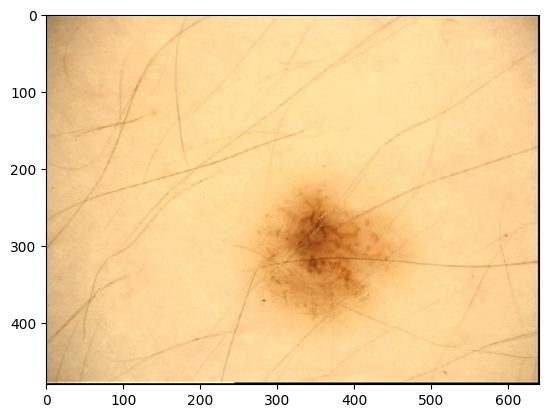

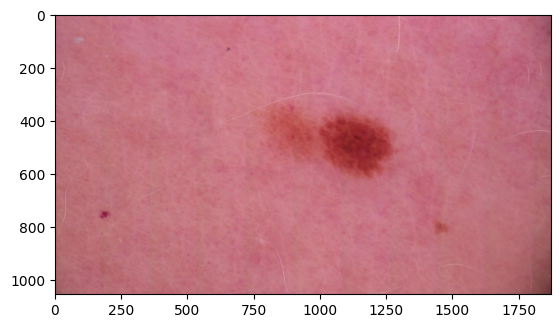

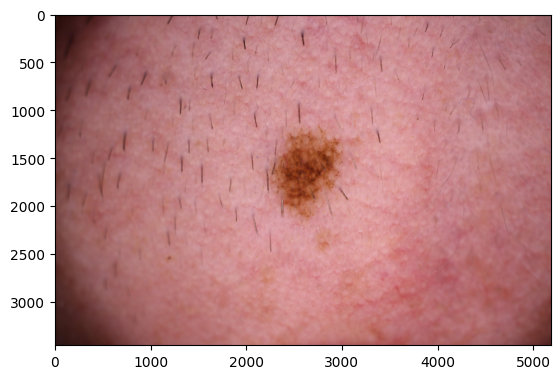

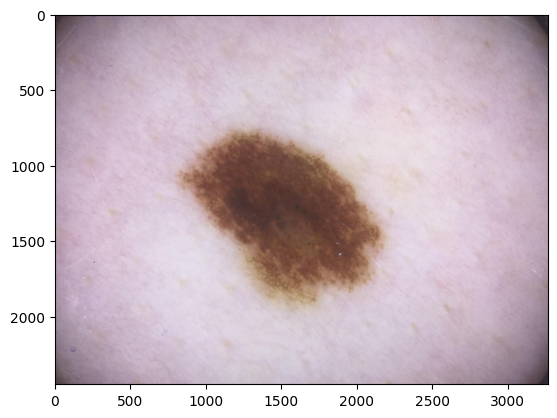

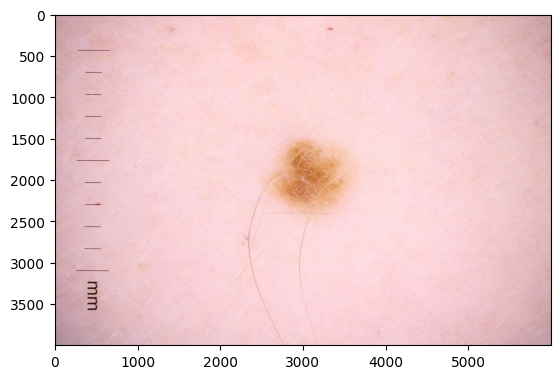

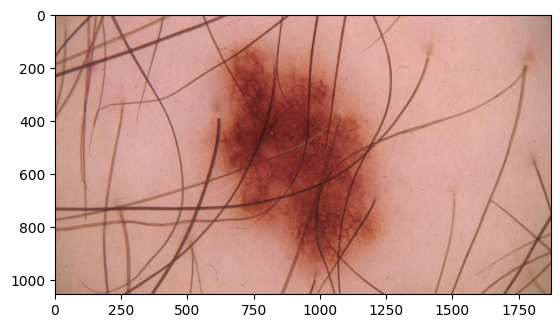

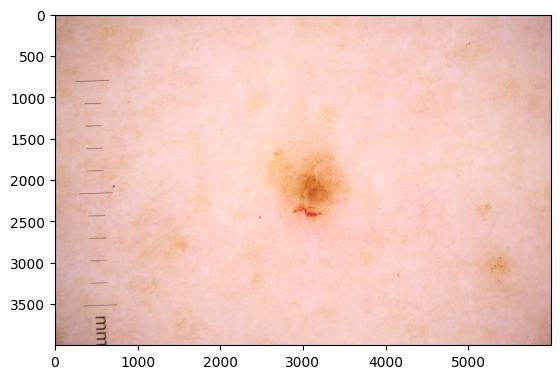

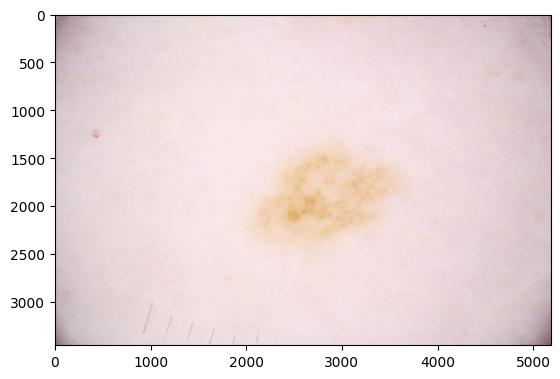

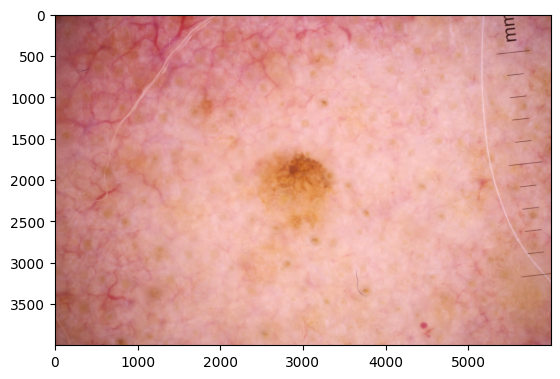

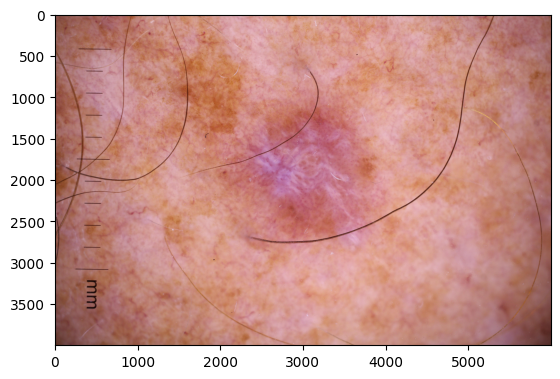

In [10]:
for i, image in enumerate(images[:10]):
  plt.imshow(image)
  plt.show()

## Hair Removal

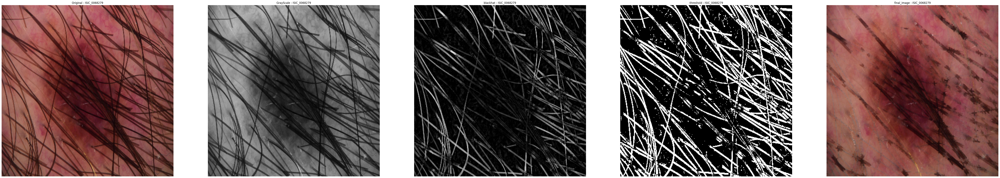

In [20]:
import cv2
import matplotlib.pyplot as plt


image_name = 'ISIC_0068279'
BASE_PATH = '/content/siim-isic2020/jpeg/train/'

# Einlesen
image = cv2.imread(BASE_PATH + image_name + '.jpg')
image_resize = cv2.resize(image, (400, 400))

# Anzeigen der Bilder auf einer Axes
fig, axes = plt.subplots(1, 5, figsize=(80, 80))

# Orginal
axes[0].imshow(cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB))
axes[0].axis('off')
axes[0].set_title('Original : ' + image_name)

# GrayScale
grayScale = cv2.cvtColor(image_resize, cv2.COLOR_RGB2GRAY)
axes[1].imshow(grayScale, cmap='gray')
axes[1].axis('off')
axes[1].set_title('GrayScale : ' + image_name)

# Kernel
kernel = cv2.getStructuringElement(1, (9, 9))

# Blackhat-Filter
blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
axes[2].imshow(blackhat, cmap='gray')
axes[2].axis('off')
axes[2].set_title('blackhat : ' + image_name)

# Threshold
ret, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)
axes[3].imshow(threshold, cmap='gray')
axes[3].axis('off')
axes[3].set_title('threshold : ' + image_name)

# Finales Bild
final_image = cv2.inpaint(image_resize, threshold, 1, cv2.INPAINT_TELEA)
axes[4].imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
axes[4].axis('off')
axes[4].set_title('final_image : ' + image_name)

plt.show()
